# Patryk Barkowski - projekt
___
___
___
### Analiza Danych Elektrofizjologicznych 2017
---
Witam w moim królestwie.<br>Postaram się możliwie uprzyjemnić podróż przez niniejszą pracę - ma być ładnie, wizualnie i - **mam nadzieję!** - przejrzyście. Poniżej spis treści, gdybyś miał się zgubić:
1. przygotowanie do pracy
2. wczytanie pliku
3. filtrowanie
4. pozycje elektrod (montaż)
5. epokowanie
6. ICA
7. porównania w domenie czasu: ERPy
8. porównania w domenie częstotliwości: widma
9. podsumowanie

___
**Mikołaju**, postaram się wszystko dokładnie opisywać, co i dlaczego robię. Nie będę ukrywał, że korzystałem z notebooków, które był ekstremalnie przydatne. Wprowadziłem jednak pewne zmiany:
1. przede wszystkim jest "fanem" ekonomicznych kodów; oznacza to, że tworzę nowe zmienne tylko tam, gdzie będę używał czegoś w wiecej niż 1-2 linijkach
2. podczas pracy nad większością punktów starałem się dodawać od siebie coś ekstra - a to więcej porównań, a to więcej warunków (nawet gdy momentami przeczy to z punktem pierwszym - jak pokazywanie Tobie (i sobie) sygnału przed i po filtrowaniu)
3. etap prac "5. epokowanie" przebiegał u mnie dość burzliwie; long story short - początkowo epokowałem przez przypadek wraz z "wydarzeniem" punktu fiksacji. Oczywiście w pracy, którą czytasz, poprawiłem ten błąd - ale pewne skutki tej zmiany zobaczysz w punkcie **Przykłady wyrzuconych epok**.
4. bądź wyrozumiały w trakcie oceniania widma - to był naprawdę potężny upiór dla mnie, walka trwała długo - i choć przegrałem tam bitwę (w moim mniemaniu), mam nadzieję iż ocenisz, że wygrałem wojnę ;)
5. robiąc projekt dla Ciebie, cały czas miałem z tyłu głowu, aby był to projekt bardzo łatwy do sprawdzania - dlatego też usunąłem wszelkie *%matplotlib* oraz *%matplotlib inline* z których oczywiście korzystałem. Ponadto wrzucę projekt jako swoje repozytorium - wszystko dla wygody.

___
___
___
___
___
## 1. przygotowanie do pracy

Na dzień dobry klasyczne i zawsze oczekiwane - powitajmy **os** oraz **mne**!

In [1]:
import os
import mne

Upewaniam się czy plik (wybrałem **CAT110 20131108 2040002.raw**) jest obecny w folderze:

In [2]:
ls

 Volume in drive C has no label.
 Volume Serial Number is 045A-06F7

 Directory of C:\Users\Machina\Desktop\analizadanycheeg\projekt

05.07.2017  23:02    <DIR>          .
05.07.2017  23:02    <DIR>          ..
03.07.2017  17:27    <DIR>          .ipynb_checkpoints
23.05.2017  21:53        51˙829˙776 CAT110 20131108 2040002.raw
03.07.2017  18:00           410˙550 inne_1.png
03.07.2017  18:01           408˙701 inne_2.png
03.07.2017  18:07           350˙340 inne_3.png
03.07.2017  17:59           397˙071 miesnie_1.png
03.07.2017  18:00           432˙971 miesnie_2.png
03.07.2017  18:02           407˙601 miesnie_3.png
03.07.2017  18:04           417˙949 miesnie_4.png
03.07.2017  18:04           413˙187 miesnie_5.png
03.07.2017  18:03           405˙863 mruganie_1.png
03.07.2017  18:03           393˙753 mruganie_2.png
03.07.2017  18:09           360˙486 mruganie_3.png
05.07.2017  23:02        13˙839˙095 proj2017patrykbarkowski.ipynb
03.07.2017  18:07           371˙720 ruchoczu_1.png
03.07.201

Na koniec żeby nie męczyć się za mocno z kopiowaniem nazwy, zrobię zmienną z nazwą pliku:

In [3]:
plik = "CAT110 20131108 2040002.raw"

___
___
___
___
___
## 2. wczytywanie pliku

Klasyczna komenda dla wczytania pliku z rozszerzeniem .raw:

In [4]:
dane = mne.io.read_raw_egi(plik, preload=True)

Reading EGI header from CAT110 20131108 2040002.raw...
    Reading events ...
    Assembling measurement info ...
    Synthesizing trigger channel "STI 014" ...
    Excluding events {} ...
    Found multiple events at the same time sample. Cannot create trigger channel.
Reading 0 ... 177498  =      0.000 ...   709.992 secs...


Sprawdzę szybko ile kanałów ma mój sygnał:

In [5]:
dane

<RawEGI  |  CAT110 20131108 2040002.raw, n_channels x n_times : 73 x 177499 (710.0 sec), ~99.0 MB, data loaded>

73 kanały, nieźle! Dzięki temu wiem, ile kanałów chcę wyświetlać w plotach.

___
___
___
___
___
## 3. filtrowanie

Zastosuję następujące filtry: górno-przepustowy 1Hz oraz low transition bandwith 0,25Hz.

Dodatkowo, zgodnie z wskazówkami z zajęć, kopiuję dane tak, aby nie ingerować w oryginalny surowy sygnał.

In [6]:
dane2 = dane.copy();
dane2.filter(1, None, l_trans_bandwidth=0.25);

Setting up high-pass filter at 1 Hz
Filter length of 6600 samples (26.400 sec) selected


Porównam sobie sygnał sprzed filtrowania...

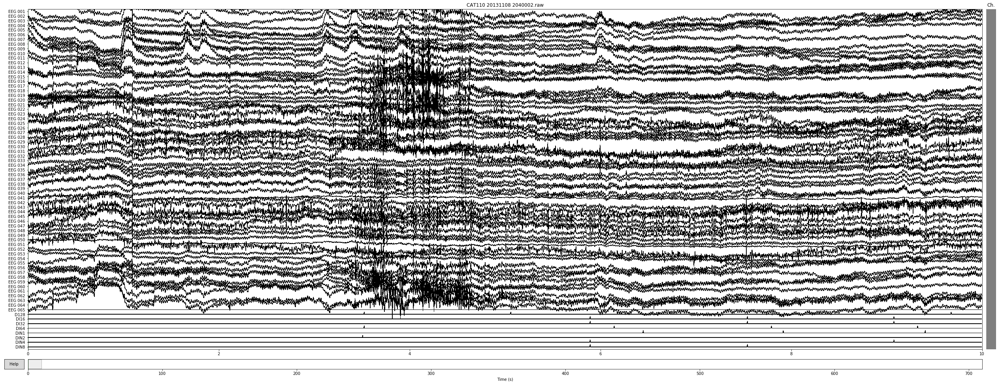

In [7]:
dane.plot(start=0, n_channels=73);

... oraz efekt po filtrowaniu, upewniam się, że sygnał zauważanie mniej "pływa":

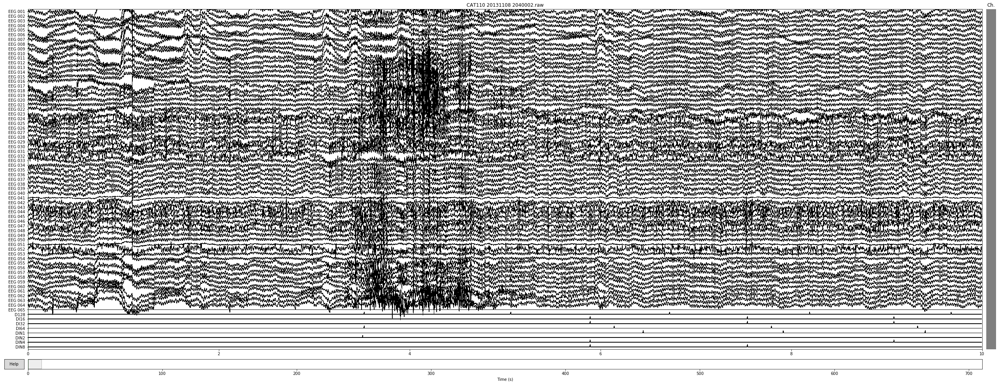

In [8]:
dane2.plot(start=0, n_channels=73);

Dowiedziałem się również przy okazji, że cały plot to 64 elektrody rejestrujące, jedna referencyjna oraz osiem kanałów "zdarzeniowych".

___
___
___
___
___
## 4. pozycje elektrod

Ponieważ kanały nazywające się np. EEG033 wstępnie nie dają mi (any pythonowi) jakiejkolwiek informacji, muszę wczytać odpowiedni montaż. Zgodnie z instrukcją, będzie to **GSN-HydroCel-65_1.0**. Nie będę tworzył zmiennych jak na zajęciach, ponieważ później nie przydadzą mi się w projekcie.

In [9]:
mne.channels.read_montage('GSN-HydroCel-65_1.0')

<Montage | GSN-HydroCel-65_1.0 - 68 channels: FidNz, FidT9, FidT10 ...>

Zmieniam nazwy kanałów zgodnie z instrukcją z "bolączek", jednocześniej upewniając się, że zmiana jest zgodna z tym, co chciałem osiągnąć - czyli zmianą z EEG001 na E1, EEG02 na E2 i tak dalej:

In [10]:
from mypy.chans import correct_egi_channel_names

correct_egi_channel_names(dane2)
print(dane2.ch_names[:8])

['E1', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8']


In [11]:
dane2.set_montage(mne.channels.read_montage('GSN-HydroCel-65_1.0'))

Szybko upewnię się, że mam nowe nazwy w moim sygnale:

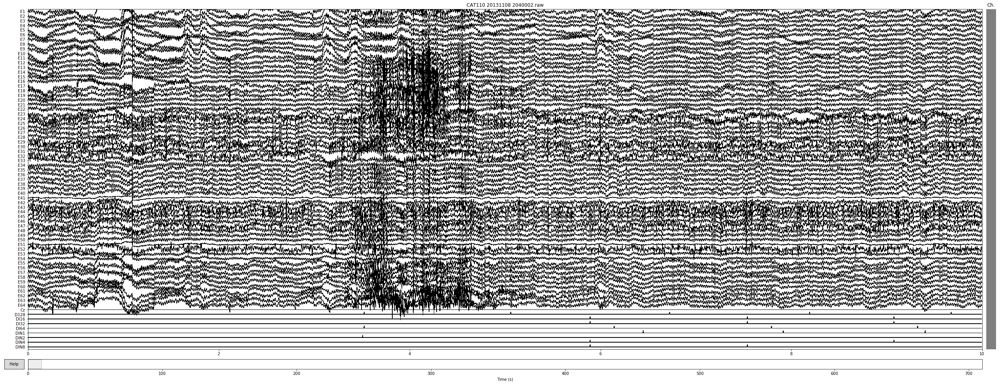

In [12]:
dane2.plot(start=0, n_channels=73);

Sukces! Czas na..

___
___
___
___
___
## 5. epokowanie
Podzielę teraz sygnał według konkretnych wydarzeń.

___
### 5.1 tworzenie wydarzeń
Dla przypomnienia oraz ułatwienia kolejnych etapów pracy, szybka przypominajka wartości wydarzeń w procedurze "twarze i samochody":
* 1 - osoba badana wciska strzałkę w lewo
* 2 - osoba badana wciska strzałkę w prawo
* 3 - osoba badana wciska spację
* 36 - na ekranie prezentowany jest samochód pod kątem 0 stopni
* 40 - na ekranie prezentowany jest samochód pod kątem 90 stopni
* 44 - na ekranie prezentowany jest samochód pod kątem 180 stopni (do góry "nogami")
* 52 - na ekranie prezentowana jest twarz pod kątem 0 stopni
* 56 - na ekranie prezentowana jest twarz pod kątem 90 stopni
* 60 - na ekranie prezentowana jest twarz pod kątem 180 stopni (do góry nogami)
* 128 - na erkanie pojawia się krzyżyk fiksacji I jeszcze kilka innych wydarzń, które nie są tak ważne.

Najpierw wyciagnę informację z kanałów DIN ze zmianą na konkretne, wyżej opisane wydarzenia:

In [13]:
import mypy
wydarzenia = mypy.events.get_events_from_din(dane2)

A następnie usuwam niepotrzebne już kanały DIN:

In [14]:
dane2.drop_channels(['DIN1', 'DIN2', 'DIN4', 'DIN8', 'DI16', 'DI32', 'DI64', 'D128'])

<RawEGI  |  CAT110 20131108 2040002.raw, n_channels x n_times : 65 x 177499 (710.0 sec), ~88.1 MB, data loaded>

Obecna wartość w n_channels=65, czyli z pierwotnych 73 wypadło 8 (tyle ile wyżej zdefiniowanych). So far so good!

___
### 5.2 tworzenie epok w oparciu o wydarzenia

Ważny moment: wybieram, które wydarzenia są dla mnie ważne. Dalej opiszę dlaczego wybrałem te konkretne, co będę ze sobą porównywał i tym podobne. Póki co poepokuję... wszystko związane z twarzami i samochodami. Będzie trochę pracy przy zaznaczniu złych epok, ale czego nie robi się w imię nauki? Epokuję po 0,5 sekundy przed i po bodźcu.

In [15]:
doepokowania = [36, 40, 44, 52, 56, 60]

In [16]:
epoki = mne.Epochs(dane2, events=wydarzenia, event_id=doepokowania,
                   tmin=-0.5, tmax=0.5, preload=True)

412 matching events found
0 projection items activated
Loading data for 412 events and 251 original time points ...
0 bad epochs dropped


In [17]:
# I tutaj, drogi czytelniku, popełniłem na początki pisania ogromny błąd: otóż "doepokowania" wrzuciłem również zdarzenie 128, 
# czyli kompletnie nie interesującą mnie rzecz.
# Ale jak to w życiu bywa: ciekawe rzeczy dzieją się po tym, gdy się mylimy - więcej wytłumaczę za chwilę!

___
### 5.3 przeglądanie złych epok i ich usuwanie

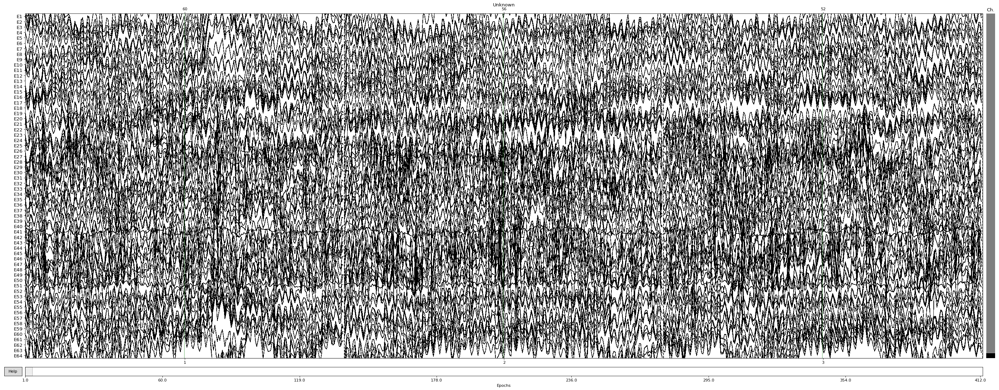

In [18]:
#przy pomocy %matplotlib znalazałem i zaznaczyłem epoki do wyrzucenia;
epoki.plot(n_channels=64, n_epochs=3);

In [19]:
# w kolejnych podejściach do projektu zapisałem numery epok - dzięki czemu sprawdzając projekt po sobie,
# mogę umieścić je w komendzie raz na stałe:
epoki.drop([6, 11, 14, 30, 145, 156, 207, 233, 240, 252, 312, 343, 344, 385, 390, 391, 403, 406, 411])

Dropped 19 epochs


<Epochs  |  n_events : 393 (all good), tmin : -0.5 (s), tmax : 0.5 (s), baseline : (None, 0), ~49.0 MB, data loaded,
 '36': 67, '40': 65, '44': 65, '52': 65, '56': 65, '60': 66>

Cały sygnał jest całkiem ładny - jak na taką liczbę epok, zdecydowałem się wyrzucić dość mało. Duża w tym zasługa pominięciu mrugania - domyślam się, że przed ICA musiały być ciężkie czasy dla badaczy ręcznie sprawdzających całe sygnały.

### **Przykład wyrzuconych epok** <br>
Niestety, wrzucam zrzuty ekranu, ponieważ próba pokazania tych epok w kodzie była bardzo "niewyraźna". Stety, szybko nauczyłem się jak wrzucać zdjęcia do notebooka! W końcu obiecywałem coś ekstra.

In [20]:
from IPython.display import Image

___
___

In [21]:
# **********************************************Uwaga!**********************************************
# Poniższe zdjęcia są wrzucone z pierwszej wersji mojej pracy: wówczas przez pomyłkę wyepokowałem również punkty fiksacji i
# miałem 825 epok do przeglądania. W obecnej wersji - poprawionej już - epok miałem 412, i nie miałem aż tak wyraźnych
# artefaktów. Cały sygnał był dość ładny, znalazłem tylko 19 epok do wyrzucenia. Poniżej zdecydowałem się zostawić swoje
# stare przykłady, jakie odrzucałem - oceń proszę na ich podstawie, czy dobrze to robiłem, ponieważ w najnowszej wersji
# stosowałem ten sam system.

___
___ 
Pliki o nazwach * **miesnie_1, miesnie_2, miesnie_3, miesnie_4, miesnie_5** * zawierają przykładowe artefakty mieśniowe, jakie zaznaczałem do wyrzucenia, przy czym najlepiej widoczne są w 4 i 5.

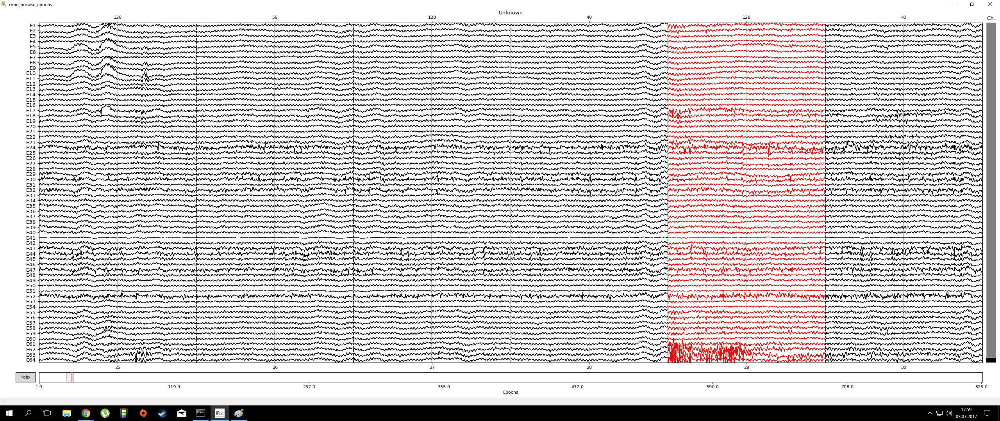

In [22]:
Image("miesnie_1.png")

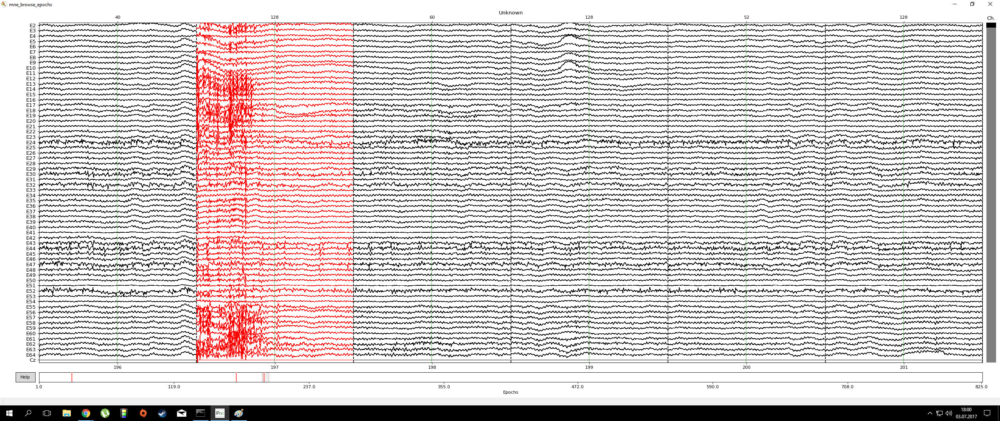

In [23]:
Image("miesnie_2.png")

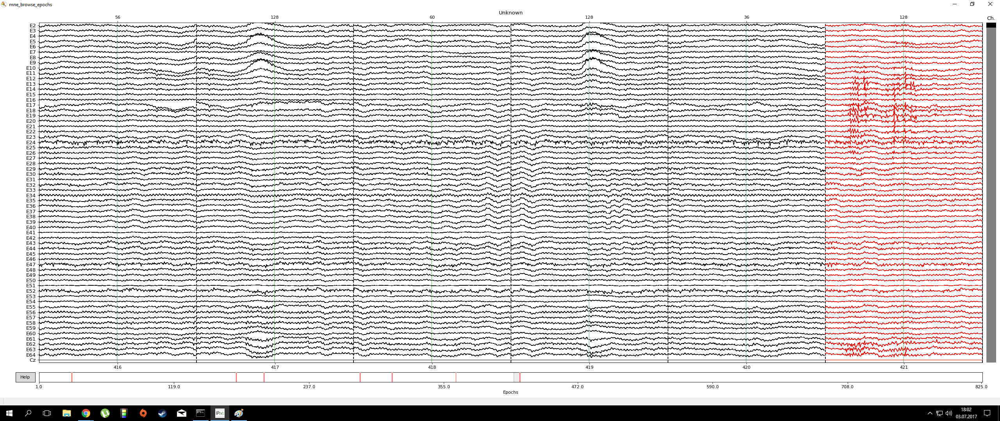

In [24]:
Image("miesnie_3.png")

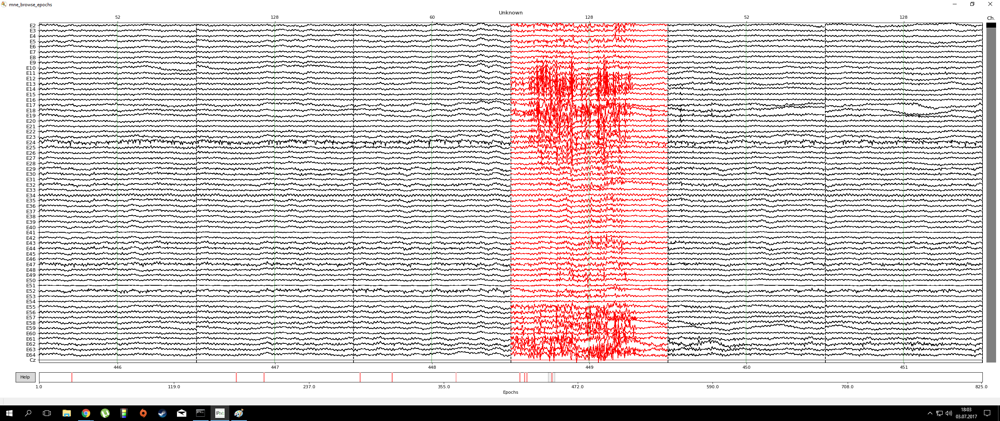

In [25]:
Image("miesnie_4.png")

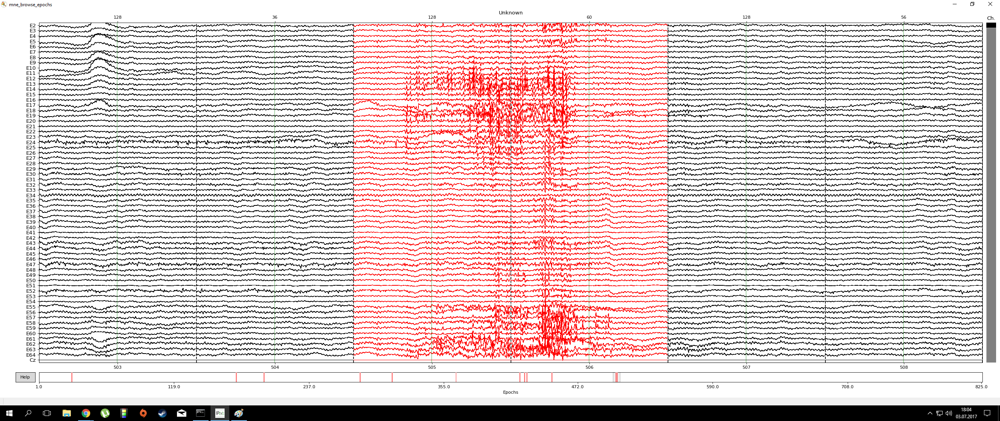

In [26]:
Image("miesnie_5.png")

___ 
___
Pliki o nazwach ** *mruganie_1, mruganie_2, mruganie_3* ** - zawierają przykłady artefaktów związanych z mruganiem, które zdecydowałem się zostawić w sygnale, aby później usunąć je przy pomocy ICA. Zaznaczyłem je na czerwono tylko na chwilę, żeby zrobić zrzut, później odznaczałem. W ostatecznych 40 odrzuconych epokach znajdują się jednak epoki, w trakcie któych osoba badana mrugnęła dwukrotnie - spisałem te fragmenty na straty.

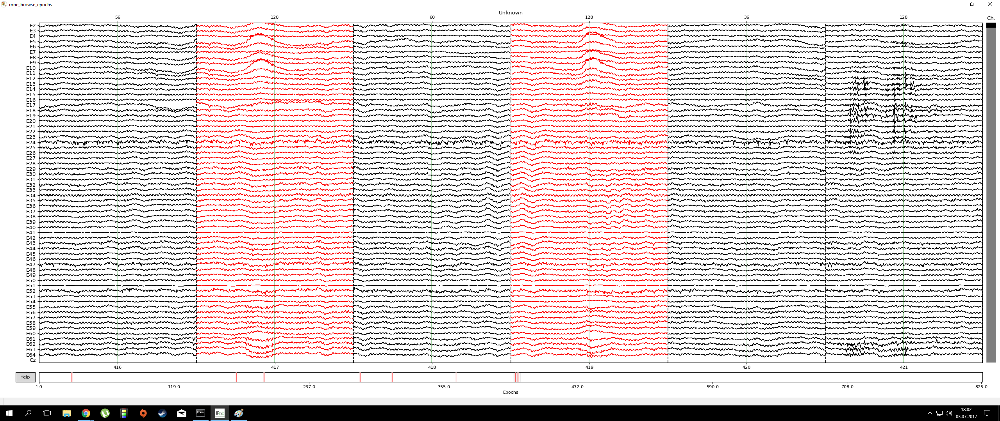

In [27]:
Image("mruganie_1.png")

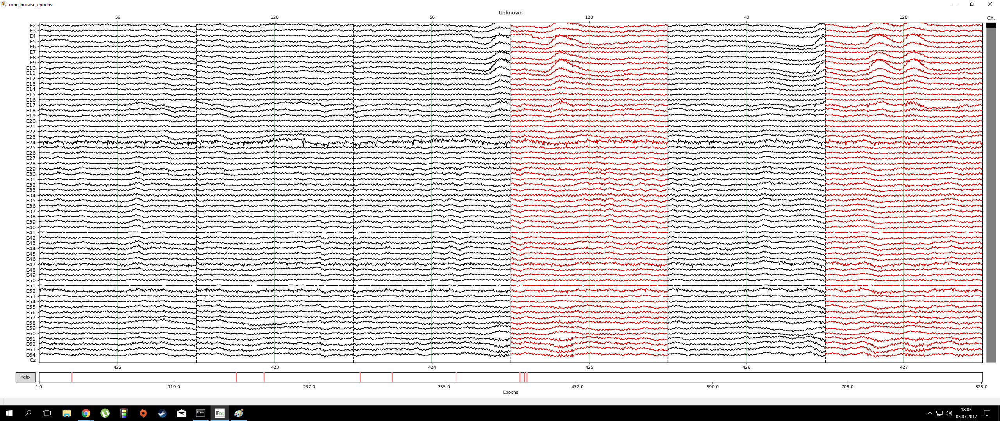

In [28]:
Image("mruganie_2.png")

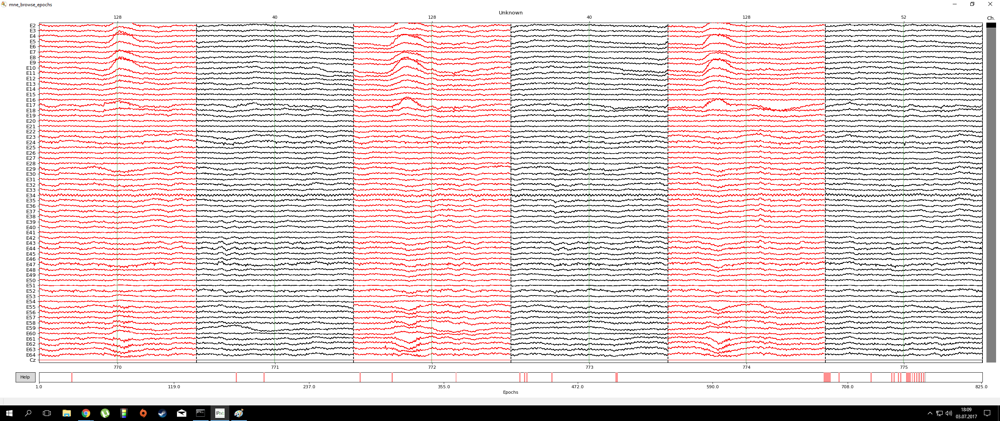

In [29]:
Image("mruganie_3.png")

___ 
___
Pliki o nazwach ** *ruchoczu_1, ruchoczu_2, ruchoczu_3* ** zawierają przykładowe artefakty ruchu oczu, jakie zaznaczałem do wyrzucenia, przy czym tych artefaktów byłem najmniej pewny - było bardzo mało charakterystycznych zapisów świadczących o tych artefaktach.

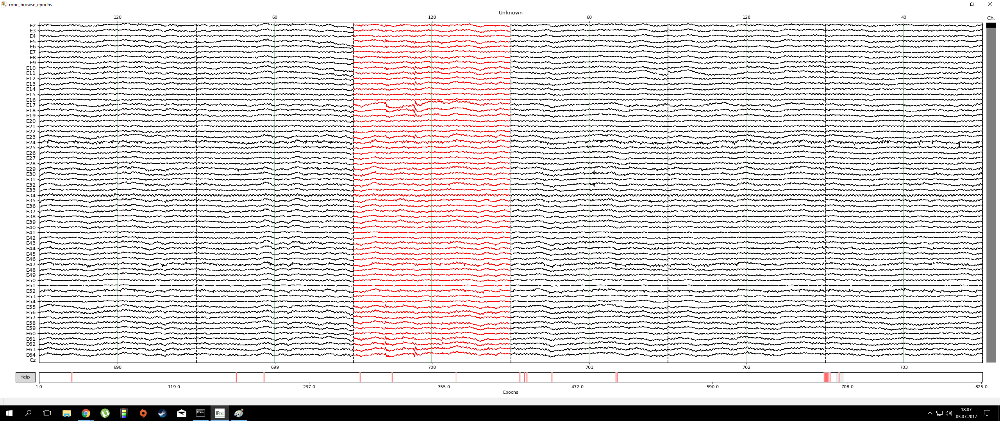

In [30]:
Image("ruchoczu_1.png")

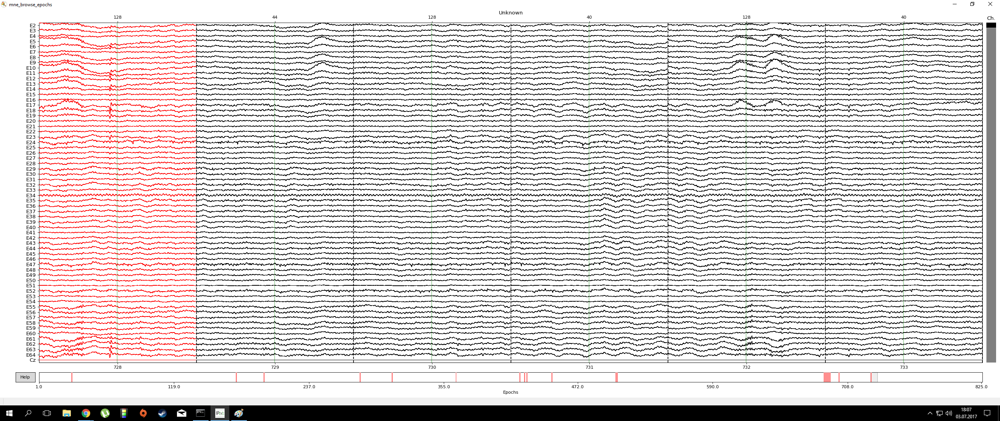

In [31]:
Image("ruchoczu_2.png")

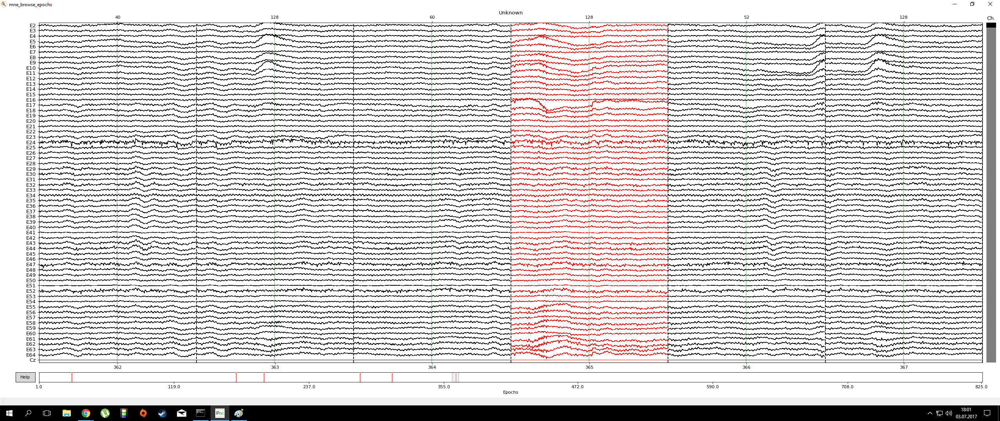

In [32]:
Image("ruchoczu_3.png")

___ 
___
Pliki o nazwach ** *inne_1, inne_2, inne_3* ** - zawierają przykłady "dziwnych" odchyleń od sygnału, które zdecydowałem się odrzucić. Wiem, że w inne_3 mogłbym "wygasić" te dwie elektrody, ale w znaczej cześćci sygnału nie było z nimi problemu, dlatego zdecydowałem się je zostawić.

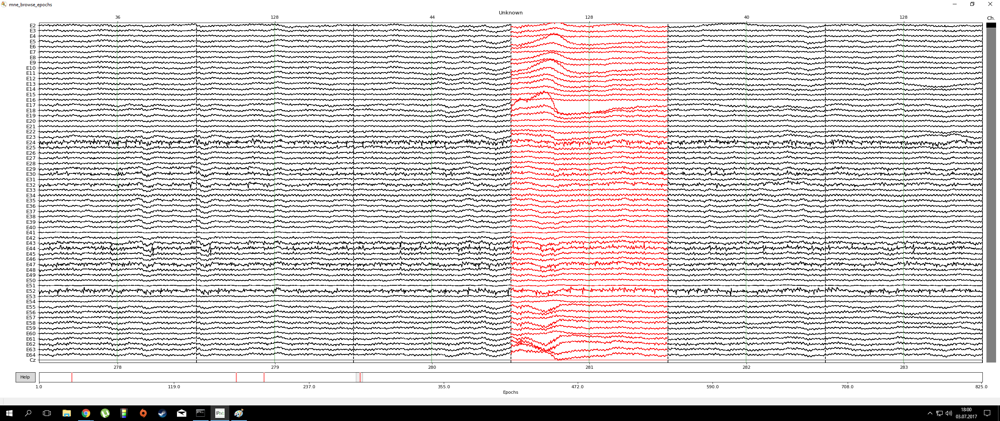

In [33]:
Image("inne_1.png")

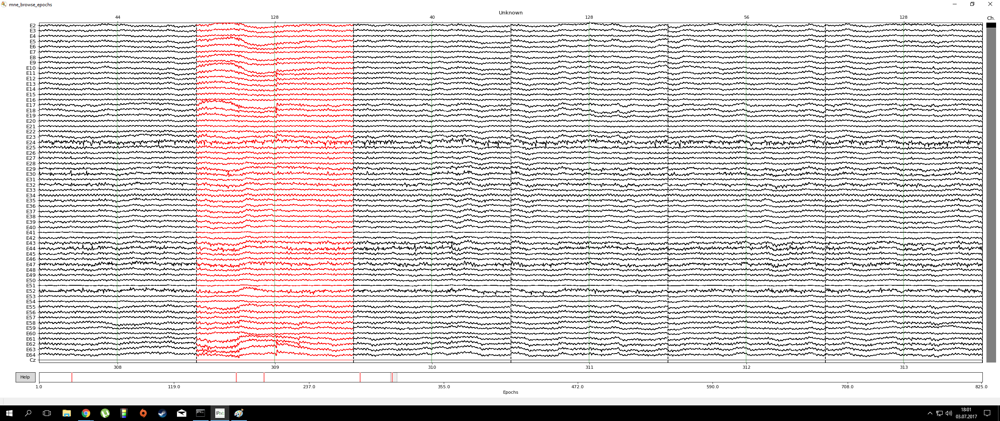

In [34]:
Image("inne_2.png")

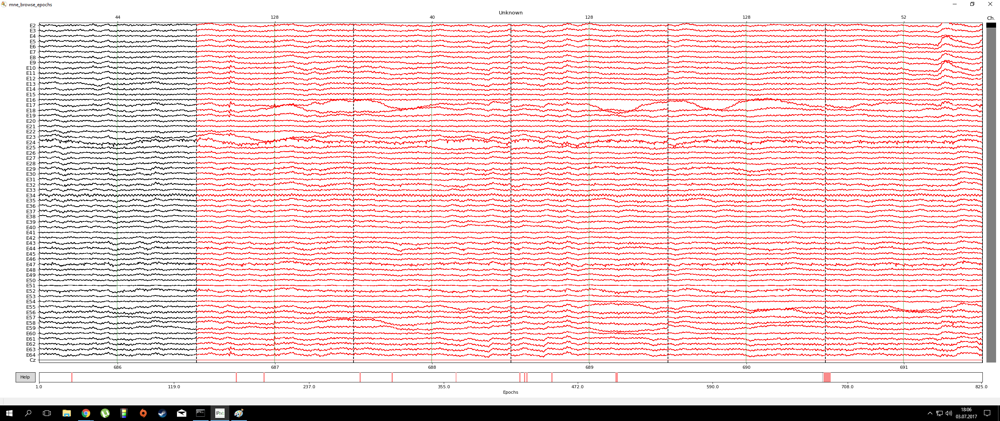

In [35]:
Image("inne_3.png")

___
___
___
___
___
## 6. ICA
Jakby powiedział Mikołaj na zajęciach: "czas zająć się ICA i wyczyścić dobrze te dane."

___
### 6.1 dopasowanie ICA

Najpierw referencja do średniej, następnie wyciągam **ICA** z **mne.preprocessing**:

In [36]:
epoki.set_eeg_reference()
epoki.apply_proj()

Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but hasn't been applied yet. Use the .apply_proj() method function to apply projections.
Created an SSP operator (subspace dimension = 1)
1 projection items activated
SSP projectors applied...


<Epochs  |  n_events : 393 (all good), tmin : -0.5 (s), tmax : 0.5 (s), baseline : (None, 0), ~49.0 MB, data loaded,
 '36': 67, '40': 65, '44': 65, '52': 65, '56': 65, '60': 66>

In [37]:
from mne.preprocessing import ICA
ica = ICA(method='extended-infomax', n_components=0.99)
print(ica)

<ICA  |  no decomposition, fit (extended-infomax):  samples, no dimension reduction>


Najbardziej pracochłonna komenda dla komputera - wyliczam komponenty, które wyjaśniają największą liczbę wariancji sygnału:

In [40]:
ica.fit(epoki)

Fitting ICA to data using 65 channels. 
Please be patient, this may take some time
Selection by explained variance: 47 components
computing Extended Infomax ICA


<ICA  |  epochs decomposition, fit (extended-infomax): 98643 samples, 47 components, channels used: "eeg">

In [64]:
%matplotlib inline

In [57]:
%matplotlib

Using matplotlib backend: Qt5Agg


___
### 6.2 wyszukiwanie artefaktów

Zerknij na policzone komponenty oraz na ich plot:

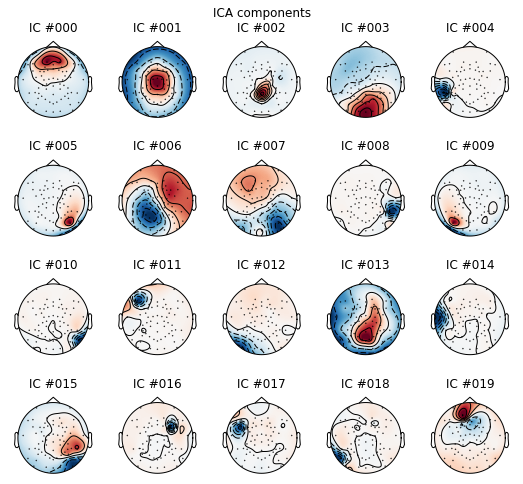

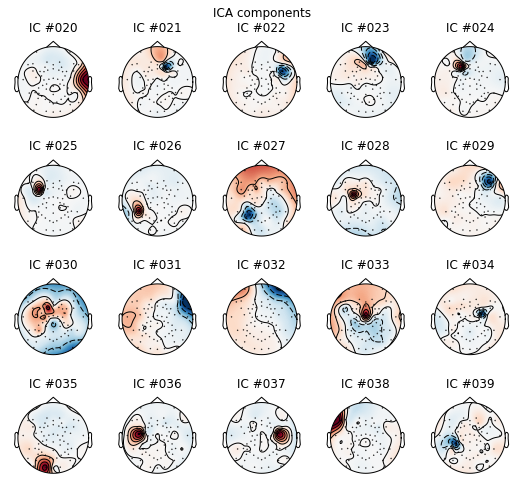

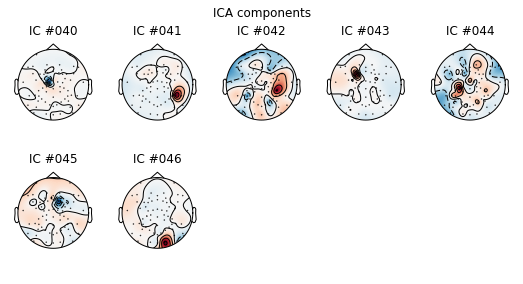

In [41]:
# ja w międzyczasie na %matplotlib przejrzałem sobie pierwszych 19 komponentów:
ica.plot_components(inst=epoki);

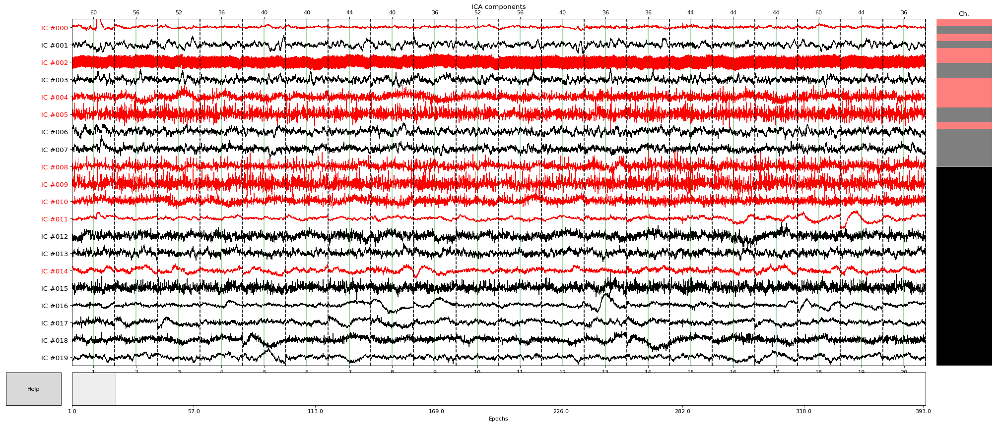

In [65]:
ica.plot_sources(epoki);

Na podstawie map cieplnych oraz plotu komponentów, decyduję się odrzucić powyższe, wskazane na czerwono.
Poniżej powody, dla których decydowałem się odrzucać dany komponent:

___
**Artefakt związany z oczyma - mruganie**

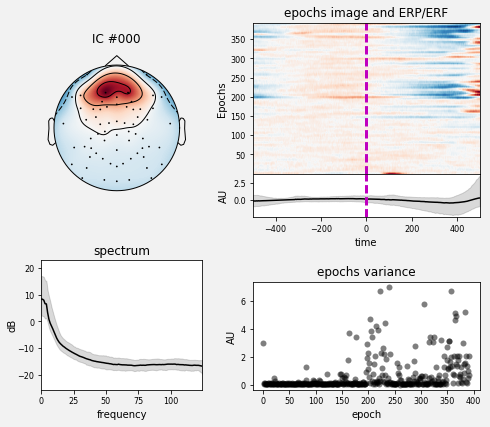

In [42]:
ica.plot_properties(picks=0, inst=epoki, image_args=dict(sigma=2.5));

___
**Artefakt związany z siecią:**

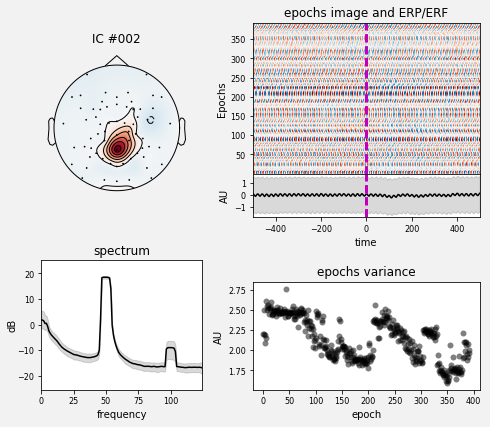

In [43]:
ica.plot_properties(picks=2, inst=epoki, image_args=dict(sigma=2.5));

**Ruchy horyzontalne oczu:**

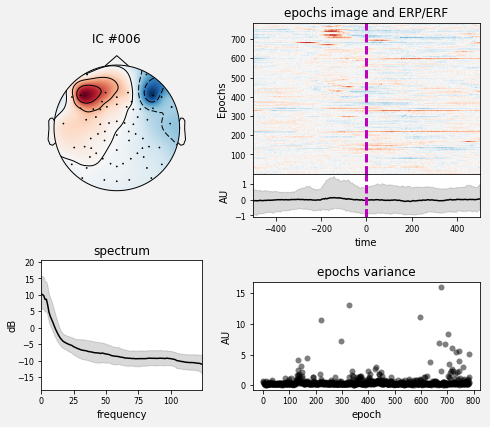

In [62]:
### UWAGA! w obecnym projekcie nie ma artefaktu zwiazanego z ruchem horyzontalnym!
### między innymi dlatego zdecydowałem się zostawić wcześniej przykłądy starych epok.
### Pokazuję tylko jako przykład sprzed wyłączenia punktu fiksacji do epok.
### DAWNY KOMPONENT, NIE OBECNY:
### ica.plot_properties(picks=6, inst=epoki, image_args=dict(sigma=2.5));

**Artefakty mięśniowe i/lub zwiazane z jedną elektrodą:**

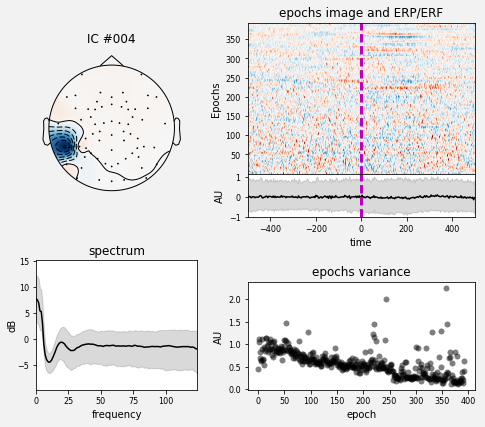

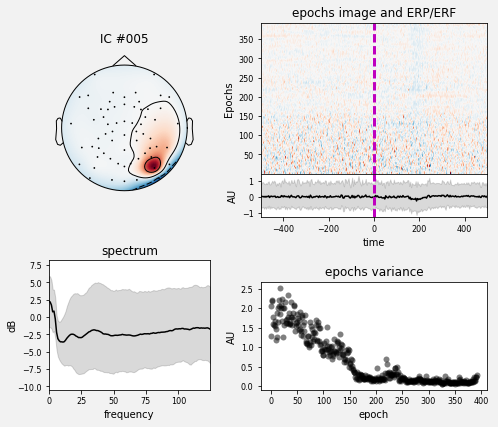

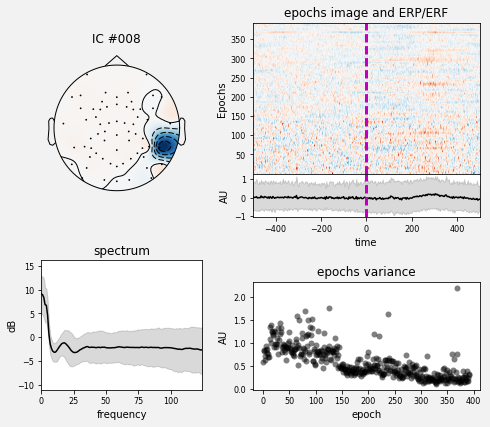

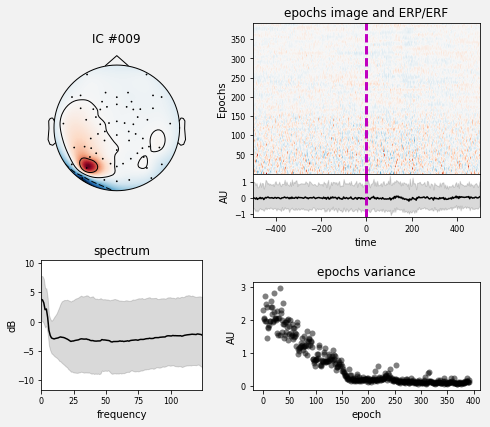

In [45]:
ica.plot_properties(picks=[4, 5, 8, 9], inst=epoki, image_args=dict(sigma=2.5));

___
**Artefakty mięśniowe:**

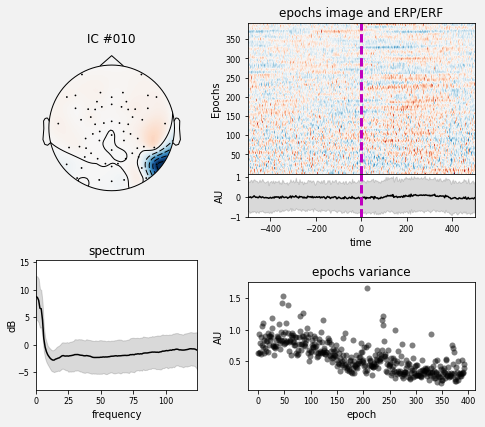

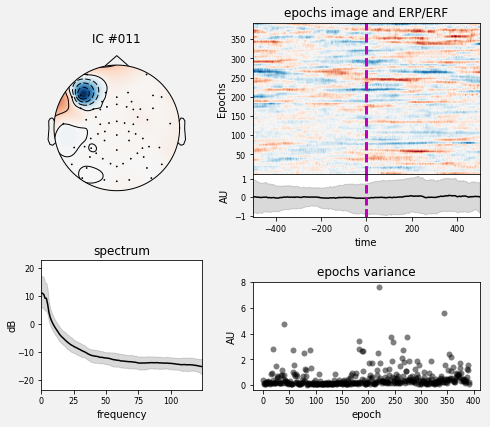

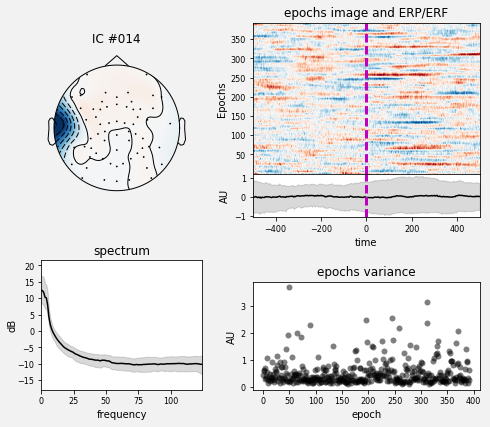

In [47]:
ica.plot_properties(picks=[10, 11, 14], inst=epoki, image_args=dict(sigma=2.5))

Sprawdzam zaznaczone komponenty:

In [66]:
ica.exclude

[0, 2, 4, 5, 8, 9, 10, 11, 14]

Następnie - klasyczną wskazówką, pracując na kopii - usuwam komponenty:

In [67]:
epoki_czyste = ica.apply(epoki.copy())

Transforming to ICA space (47 components)
Zeroing out 9 ICA components


Ok, sygnał mamy teraz względnie ładny - najważniejsze artefakty zostały usunięte z przefiltrowanego sygnału.<br>Czas zrobić z niego jakiś użytek!

___
___
___
___
___
## 7. porównania w domenie czasu - ERPy

Przypominajka - poepokowałem sobie sygnał według następujących wydarzeń:
* 36 - na ekranie prezentowany jest samochód pod kątem 0 stopni
* 40 - na ekranie prezentowany jest samochód pod kątem 90 stopni
* 44 - na ekranie prezentowany jest samochód pod kątem 180 stopni (do góry "nogami")
* 52 - na ekranie prezentowana jest twarz pod kątem 0 stopni
* 56 - na ekranie prezentowana jest twarz pod kątem 90 stopni
* 60 - na ekranie prezentowana jest twarz pod kątem 180 stopni (do góry nogami)

Najpierw przycinam epoki na 0,2s przed bodźcem (po bodźcu bez zmian, tj. 0,5s)

In [68]:
epoki_erp = epoki_czyste.copy().crop(tmin=-0.2)

I "wybieram" Peakchu, który pomoże mi znaleźć najlepsze dla porównań elektrody:

In [69]:
from mypy.chans import Peakachu

No i będę porównywał wiecej niż jedną "rzecz", a w każdym porównaniu więcej niż 2 warunki - mam nadzieję, żę się nie obrazisz ;)

___
### 7.1 porównanie ERP dla samochodów widocznych pod różnymi kątami:

Najpierw uśredniam epoki wybranych wydarzeń w ERPy, jednocześnie zapisując je w wygodnych zmiennych:

In [70]:
erp_auto_0 = epoki_erp['36'].average()
erp_auto_90 = epoki_erp['40'].average()
erp_auto_180 = epoki_erp['44'].average()

Następnie wyszukuję "najciekawsze" załamki:

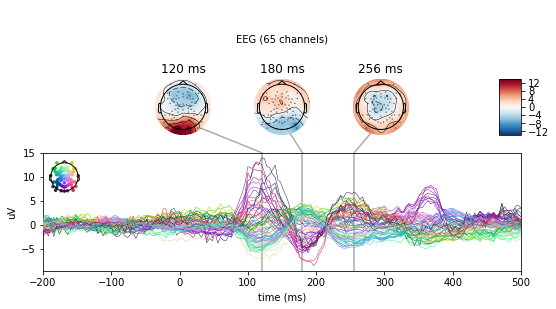

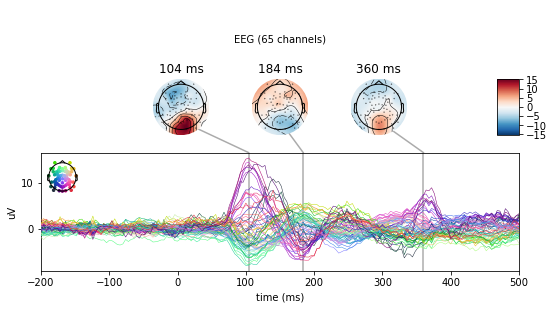

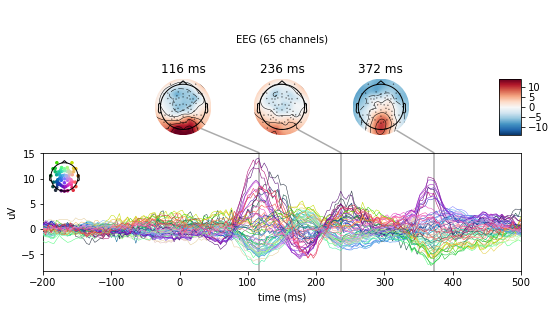

In [71]:
erp_auto_0.plot_joint();
erp_auto_90.plot_joint();
erp_auto_180.plot_joint();

Bez zaskoczenia: najwięcej dzieje się w załamku P100, charakterystycznym dla uwagi i bodźców wzrokowych. Szukam najlepszych elektrod dla wszystkich warunków. Poszukam trzech najlepszych, tak aby znaleźć jakiekolwiek wspólne:

In [72]:
pika_auto = Peakachu(mode='P100', n_channels=3)

**Auto w normalnej pozycji:**

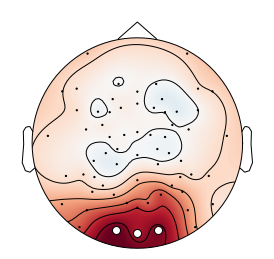

In [73]:
pika_auto.fit(erp_auto_0)
pika_auto.plot_topomap();

**Auto odwrócone o 90\*:**

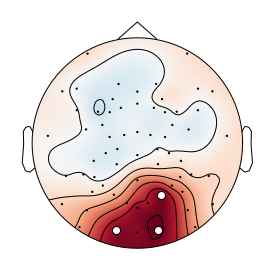

In [74]:
pika_auto.fit(erp_auto_90)
pika_auto.plot_topomap();

**Auto odwrócone o 180\*:**

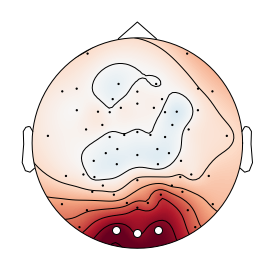

In [75]:
pika_auto.fit(erp_auto_180)
pika_auto.plot_topomap();

Ok, wybiorę 2 elektrody, które składają się na każdy warunek. Wyciągnę je z auta widzianego prosto, poprzez wybór dwóch najmocniejszych elektrod. Powinienem otrzymać te dwie elektrody po bokach, bez centralnej. Wyciągnę sobie również ich kanały i indeksy:

wybrane kanały to ['E39', 'E35']
ich indeksy to [38, 34]


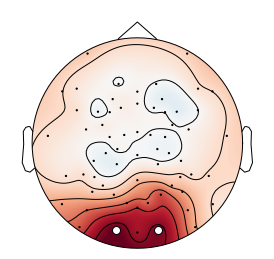

In [76]:
pika_auto_wybor = Peakachu(mode='P100', n_channels=2)
pika_auto_wybor.fit(erp_auto_0)
pika_auto_wybor.plot_topomap();
print("wybrane kanały to", pika_auto_wybor._chan_names)
print("ich indeksy to", pika_auto_wybor._chan_ind)

Wszystko zgodnie z założeniami; czas porównać te samochody! Ponieważ obiecałem, że będzie czytelnie - zaczynam od słownika:

In [77]:
auta = {'auto normalnie': erp_auto_0, 'auto odwrócone o 90*': erp_auto_90, 'auto odwrócone o 180*': erp_auto_180}

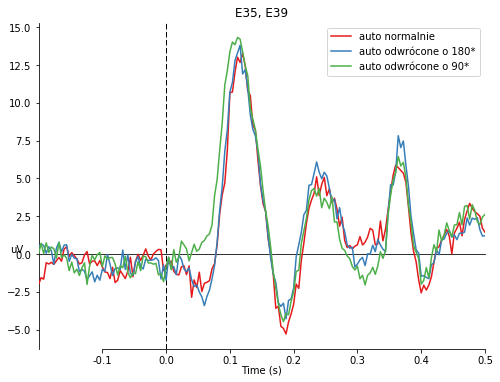

In [78]:
mne.viz.plot_compare_evokeds(auta, picks=[34, 38]);

Moim zdaniem, ciekawy wniosek: przeciętna reakcja na samochód widziany normalnie oraz odwócony o 180\* jest niemal taka sama. W przypadku auta odwróconego tylko(?) o 90\* peak zaczyna się wcześniej oraz po samym wyświetleniu bodźca od razu rośnie, podczas gdy napięcia pozostałych aut przed peakiem maleją. Później, w okolicach 360ms widzimy znacząco większą reakcję na auto odwrócone o 180\*.

___
### 7.2 porównanie ERP twarzy widocznych pod różnymi kątami:

Metoda będzie bardzo podobna, dlatego nie będę opisywał każdej komendy. Jedyna różnica: nie będę szukał ciekawych załamków, tylko od razu posłuże się obecnym stanem wiedzy i porównam charakterystyczną reakcję na twarz ludzką w postaci załamka N170.

In [79]:
erp_twarz_0 = epoki_erp['52'].average()
erp_twarz_90 = epoki_erp['56'].average()
erp_twarz_180 = epoki_erp['60'].average()

In [80]:
pika_twarz = Peakachu(mode='N170', n_channels=3)

**Twarz w normalnej pozycji:**

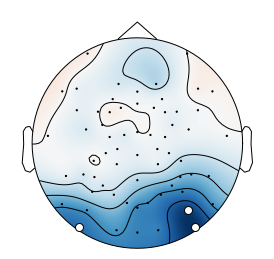

In [81]:
pika_twarz.fit(erp_twarz_0)
pika_twarz.plot_topomap();

**Twarz odwrócona o 90\*:**

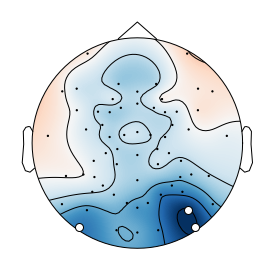

In [82]:
pika_twarz.fit(erp_twarz_90)
pika_twarz.plot_topomap();

**Twarz odwrócona o 180\*:**

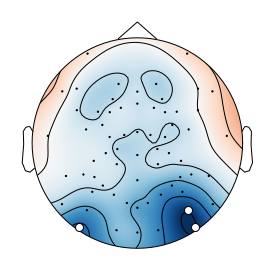

In [83]:
pika_twarz.fit(erp_twarz_180)
pika_twarz.plot_topomap();

Zakręt wrzecionowaty szaleje! ;) <br>Ponownie, wybieram dwie wspólne elektrody dla każdego warunku. Sprawdzam, czy szukając dwóch elektrod w twarzy odwróconej o 180\* zwróci mi te dwie elektrody z prawej strony.

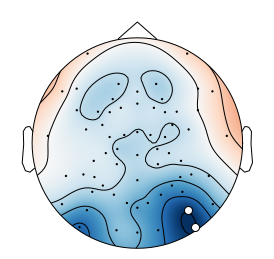

In [84]:
pika_twarz_wybor = Peakachu(mode='N170', n_channels=2)
pika_twarz_wybor.fit(erp_twarz_180)
pika_twarz_wybor.plot_topomap();

Super, w takim razie wyciągam ich pozycje i indeksy, a następnie porównuję.

In [85]:
print("wybrane kanały to", pika_twarz_wybor._chan_names)
print("ich indeksy to", pika_twarz_wybor._chan_ind)

wybrane kanały to ['E44', 'E43']
ich indeksy to [43, 42]


In [86]:
twarze = {'twarz normalnie': erp_twarz_0, 'twarz odwrócona o 90*': erp_twarz_90, 'twarz odwrócona o 180*': erp_twarz_180}

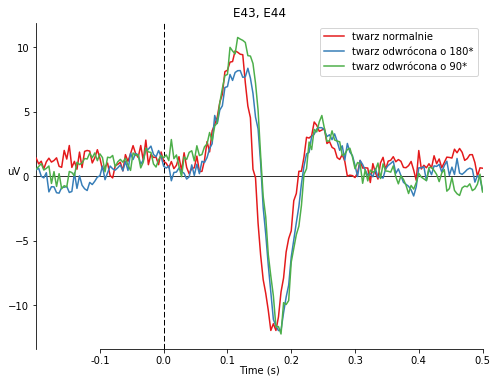

In [87]:
mne.viz.plot_compare_evokeds(twarze, picks=[42, 43]);

Ponownie: bodziec odwrócony o 90\* ma silniejszą odpowiedź około 120ms. Natomiast w specyficznym załamku N170, twarz widziana prosto osiąga maksymalną amplitudę wcześniej.

___
### 7.3 porównanie ERP twarzy i samochodu widzianego prosto:

No to w końcu porównajmy trylko dwa warunki, ale kompletnie różne: twarz oraz samochód widziane prosto. Poszukam w ostatni, niesprawdzanym jeszcze załamku Peakachu - P300. Metoda jak wcześniej:

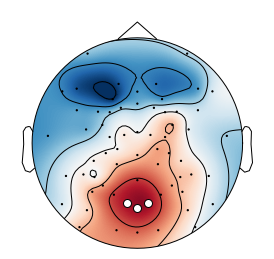

In [89]:
pika_autotwarz = Peakachu(mode='P300', n_channels=3)
pika_autotwarz.fit(erp_auto_0)
pika_autotwarz.plot_topomap();

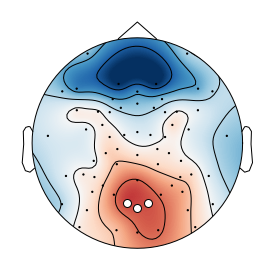

In [90]:
pika_autotwarz.fit(erp_twarz_0)
pika_autotwarz.plot_topomap();

In [91]:
print("wybrane kanały to", pika_autotwarz._chan_names)
print("ich indeksy to", pika_autotwarz._chan_ind)

wybrane kanały to ['E36', 'E38', 'E33']
ich indeksy to [35, 37, 32]


In [93]:
autatwarze = {'twarz normalnie': erp_twarz_0, 'auto normalnie': erp_auto_0}

I wykresik:

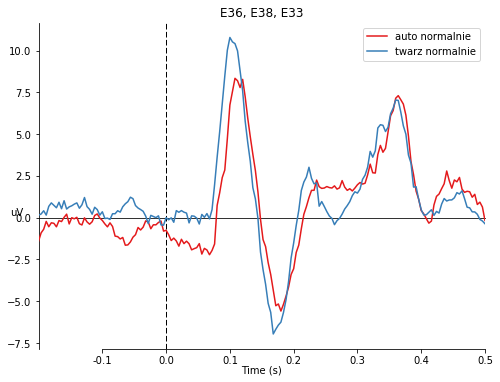

In [94]:
mne.viz.plot_compare_evokeds(autatwarze, picks=[35, 37, 32]);

Wnioski tutaj są najwyraźniejsze: reakcja na twarz ludzką jest zdecydowanie mocniejsza w załamkach P100 i N170. W P360 auto "dogoniło" twarz.

___
___
___
___
___
## 8. porównania w domenie częstotliwości: widma

Tutaj będę duuużo zgodniejszy z ostatnim notebookiem od Ciebie - temat jest trudniejszy niż wszystko co powyżej.
Plan jest następujący:
* znajdę nazwy elektrod przy skroniach oraz na potylicy (nie mogę zastosować klasycznego nazewnictwa 10-20, ponieważ w tym montażu i sygnale elektrody mają inne nazwy)
* znajdę ładny, 10 sekundowy sygnał bez artefaktów
* porównam wszystkie trzy widma; hipoteza jest taka, że skroniowe będą podobne, ale znacząco różne od potylicznej, może nawet uda się jakikolwiek wniosek wysnuć?

In [95]:
# w trybie interaktywnym poszukałem czystego sygnału, który zaraz pokażę w plocie

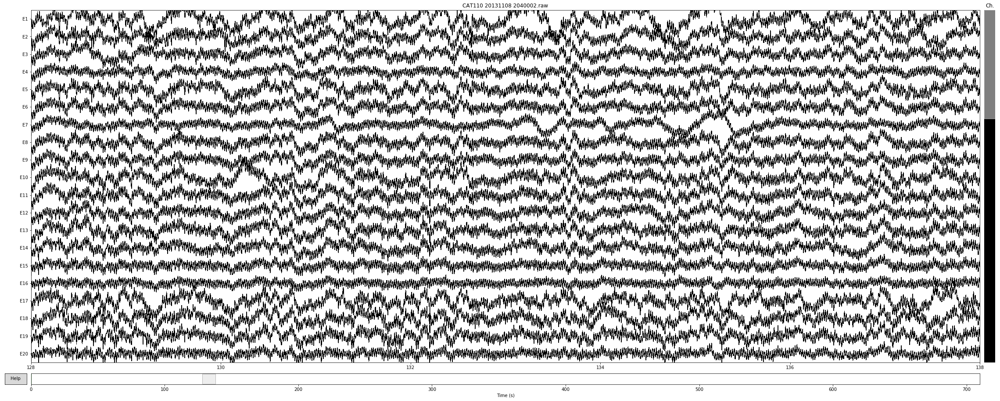

In [96]:
dane2.plot(start=128, duration=10);

Nie jest to najpiękniejszy sygnał, wiem - ale ciężko bez ICA znaleźć coś czystszego. A właśnie! Pracuję na swojej zmiennej dane2, ponieważ mimo 3 dni walki, nie potrafiłem stworzyć widm mocy dla sygnału poepokowanego i wyczyszczonego z ICA.

Przywołuję metodę Welch'a:

In [97]:
from mne.time_frequency import psd_welch

No i muszę znaleźć nazwy elektrod. Dla tego celu wyświetlę sobie ukłąd elektrod z zawartymi nazwami (show_names=True)

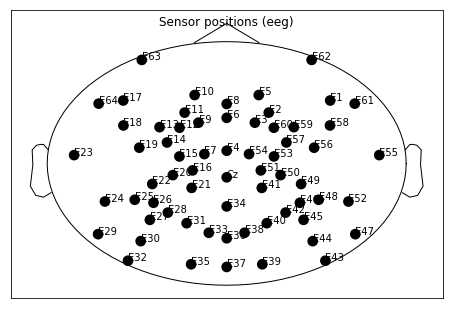

In [98]:
dane2.plot_sensors(show_names=True);

Ok, wybieram E23, E55 (skroniowe) oraz E37 (potylica). Zapiszę je w zmiennej, która automatycznie będzie wskazywała ich indeksy:

In [99]:
E23 = dane2.ch_names.index('E23')
E55 = dane2.ch_names.index('E55')
E37 = dane2.ch_names.index('E37')
wybranekanaly = [E23, E55, E37]

Poniżej definiuję warunki w funkcji Welsch'a; zgodnie ze wskazówkami z notebooka 7:

In [100]:
widmopsd, widmofreq = psd_welch(dane2, tmin=128, tmax=138, picks=wybranekanaly, n_fft=3*(dane2.info['sfreq']), fmax=35.,
                               n_overlap=(dane2.info['sfreq']))

Effective window size : 3.000 (s)


In [101]:
widmopsd.shape

(3, 106)

Tak jak się mogłem spodziewać:
* 3 kanały (przecież tyle wybrałem)
* 106 częstotliwości<br>

Zgodnie z notebookiem 7, czas dokonać transpozycji, celem odpowiedniego wyświetlenia widm mocy:

In [102]:
widmopsd.T.shape

(106, 3)

Importuję "rysowanie wykresów":

In [104]:
import matplotlib.pyplot as plt

I rysuję!

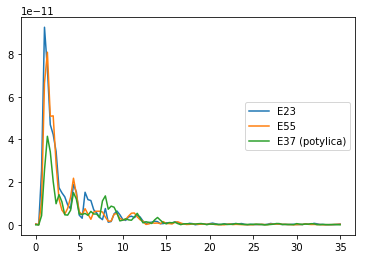

In [105]:
plt.plot(widmofreq, widmopsd.T)
plt.legend(['E23', 'E55', 'E37 (potylica)'], loc='center right')

Zmniejszę nieco zakres częstotliwości, aby dokładniej porównać różnicę:

In [106]:
widmopsd2, widmofreq2 = psd_welch(dane2, tmin=128, tmax=138, picks=wybranekanaly, n_fft=3*(dane2.info['sfreq']), fmax=15.,
                               n_overlap=(dane2.info['sfreq']))

Effective window size : 3.000 (s)


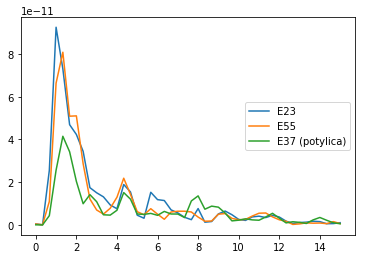

In [107]:
plt.plot(widmofreq2, widmopsd2.T)
plt.legend(['E23', 'E55', 'E37 (potylica)'], loc='center right')

Wniosek tak prosty, że aż pewnie zaśmiejesz się w głos: zakres częstotliwości theta (0,5Hz - 4Hz) jest dużo lepiej obserwowalny z okolic skroniowych, niż na potylicy :)

___
___
___
___
___
# 9. Podsumowanie

I to na tyle tej przygody.<br>
Wiem, że miało być bez feedbacku - jedyne o co proszę, to o informację gdzie ewentualnie straciłem punkty w projekcie.<br>
Do zobaczenia - mam nadzieję! - na kolejnych zajęciach. Dzięki za zainteresowanie mnie programowaniem!
___
___
___
___
___

In [108]:
nazwisko = 'Patryk Barkowski'
album = '42849'

___
___
___
___
___

In [109]:
print(nazwisko,'/// numer albumu:', album)

Patryk Barkowski /// numer albumu: 42849
